In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from os import listdir
from math import sin, cos, sqrt, atan2, radians

In [7]:
px.set_mapbox_access_token("pk.eyJ1Ijoicm1jbnJpYmVpcm8iLCJhIjoiY2s4MHh5b3ZiMGtsbTNkcGFuazR1dWc4diJ9._aDTNPlmw3Nt6QSMm3YgmQ")

In [115]:
def dist(lat1,lon1,lat2,lon2):
    #lat1,lon1,lat2,lon2 = radians(lat1), radians(lon1), radians(lat2), radians(lon2)
    lat1,lon1,lat2,lon2 = lat1.apply(np.radians), lon1.apply(np.radians), lat2.apply(np.radians), lon2.apply(np.radians)
    dlon, dlat = lon2 - lon1 , lat2 - lat1
    a = np.sin(dlat / 2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon / 2)**2
    c = 2 * np.arctan(np.sqrt(a) / np.sqrt(1 - a))
    return 6373.0 * c # em quilômetros

In [8]:
!git pull

Already up to date.


In [37]:
all_data = pd.DataFrame()
for f in listdir('data/'):
    x = pd.read_csv('data/'+ f, parse_dates=['DATAHORA'])
    all_data = all_data.append(x, sort=False)
all_data['DATAHORA'] = pd.to_datetime(all_data['DATAHORA'], errors='coerce')

In [38]:
print(all_data.shape)
all_data = all_data[all_data.LONGITUDE>-44]
all_data = all_data[all_data.LONGITUDE<-43]
all_data = all_data[all_data.LATITUDE>-23.06]
all_data = all_data[all_data.LATITUDE<-22]
all_data = all_data.dropna()
print(all_data.shape)

(1124729, 6)
(1124041, 6)


In [39]:
data_474 = all_data[all_data['LINHA']=='474.0'].sort_values(['ORDEM','DATAHORA'])
data_474.tail()

,DATAHORA,ORDEM,LINHA,LATITUDE,LONGITUDE,VELOCIDADE
85120,2020-04-07 16:24:50,A29191,474.0,-22.94630,-43.18233,17.0
95225,2020-04-07 16:35:33,A29191,474.0,-22.91412,-43.19604,15.0
102210,2020-04-07 16:48:52,A29191,474.0,-22.90262,-43.21600,34.0
112408,2020-04-07 17:02:00,A29191,474.0,-22.89196,-43.23947,15.0
122052,2020-04-07 17:15:45,A29191,474.0,-22.89416,-43.26332,0.0


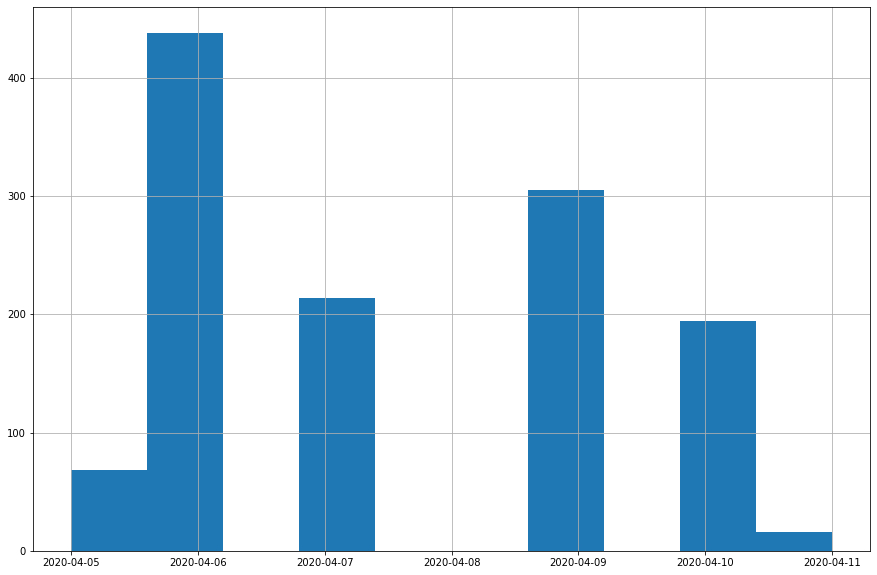

In [40]:
data_474['DATAHORA'].dt.date.hist(figsize=(15,10))

In [44]:
data_474.groupby('ORDEM').count()

,DATAHORA,LINHA,LATITUDE,LONGITUDE,VELOCIDADE
ORDEM,,,,,
A29009,190,190,190,190,190
A29016,451,451,451,451,451
A29024,90,90,90,90,90
A29048,4,4,4,4,4
A29061,118,118,118,118,118
A29103,5,5,5,5,5
A29105,4,4,4,4,4
A29123,51,51,51,51,51
A29129,175,175,175,175,175


In [90]:
resolucao = 300
b = all_data #[data_474['ORDEM'] == 'A29158']
b['lat2'] = (b['LATITUDE'] *resolucao).astype(int)/resolucao
b['lon2'] = (b['LONGITUDE'] *resolucao).astype(int)/resolucao
b2 = b.groupby(['lat2','lon2']).agg({'LATITUDE':'mean','LONGITUDE':'median','LINHA':'count'
                                    }).reset_index()
b2['freq'] = b2['LINHA'].apply(np.log)
b2.head()

,lat2,lon2,LATITUDE,LONGITUDE,LINHA,freq
0,-23.056667,-43.560000,-23.058395,-43.56142,10,2.302585
1,-23.056667,-43.556667,-23.056760,-43.55986,1,0.000000
2,-23.053333,-43.556667,-23.055941,-43.55905,8,2.079442
3,-23.053333,-43.553333,-23.054070,-43.55660,1,0.000000
4,-23.050000,-43.553333,-23.052256,-43.55414,8,2.079442


In [133]:
resolucao = 300
f = pd.DataFrame()
f2 = all_data #[data_474['ORDEM'] == 'A29158']
for o in f2['ORDEM'].unique():
    b = f2[f2['ORDEM'] == o].sort_values('DATAHORA')
    b['lat2'] = (b['LATITUDE'] *resolucao).astype(int)/resolucao
    b['lon2'] = (b['LONGITUDE'] *resolucao).astype(int)/resolucao
    b['lat3'] = b['lat2'].shift(1)
    b['lon3'] = b['lon2'].shift(1)
    b['dist'] = dist(b['lat2'],b['lon2'],b['lat3'],b['lon3'])
    b['hora_diff'] = b['DATAHORA'] - b['DATAHORA'].shift(1)
    b['hora_diff'] =b['hora_diff'].dt.seconds/60
    b['vel'] = b['dist'] / b['hora_diff']
    f = f.append(b)
f

,DATAHORA,ORDEM,LINHA,LATITUDE,LONGITUDE,VELOCIDADE,lat2,lon2,lat3,hora_diff,lon3,dist,vel
0,2020-04-05 00:21:11,D53924,2310.0,-22.88343,-43.49518,0.0,-22.883333,-43.493333,NaN,NaN,NaN,NaN,NaN
1106,2020-04-07 11:45:34,D53924,2310.0,-22.88432,-43.49510,0.0,-22.883333,-43.493333,-22.883333,684.383333,-43.493333,0.000000,0.000000
5061,2020-04-07 14:33:57,D53924,2310.0,-22.89161,-43.48444,31.0,-22.890000,-43.483333,-22.883333,168.383333,-43.493333,1.264891,0.007512
7338,2020-04-07 14:36:57,D53924,2310.0,-22.88620,-43.47644,0.0,-22.883333,-43.473333,-22.890000,3.000000,-43.483333,1.264891,0.421630
9505,2020-04-07 14:39:57,D53924,2310.0,-22.88571,-43.46880,20.0,-22.883333,-43.466667,-22.883333,3.000000,-43.473333,0.683173,0.227724
10849,2020-04-07 14:40:27,D53924,2310.0,-22.88311,-43.46882,24.0,-22.880000,-43.466667,-22.883333,0.500000,-43.466667,0.370766,0.741532
13074,2020-04-07 14:42:57,D53924,2310.0,-22.87764,-43.46365,40.0,-22.876667,-43.463333,-22.880000,2.500000,-43.466667,0.504140,0.201656
15275,2020-04-07 14:44:27,D53924,2310.0,-22.87564,-43.46792,48.0,-22.873333,-43.466667,-22.876667,1.500000,-43.463333,0.504146,0.336097
17483,2020-04-07 14:46:27,D53924,2310.0,-22.87512,-43.46804,27.0,-22.873333,-43.466667,-22.873333,2.000000,-43.466667,0.000000,0.000000
19696,2020-04-07 14:48:27,D53924,2310.0,-22.87344,-43.46393,3.0,-22.873333,-43.463333,-22.873333,2.000000,-43.466667,0.341611,0.170806


In [ ]:
g = f.dropna()
g = g[g['vel'] > 0.001]
g = g[g['vel'] < 1.5]
g = g[g['hora_diff'] < 20]
g2 = g.groupby(['lat2','lon2']).agg({'LATITUDE':'mean','LONGITUDE':'mean','vel':'mean','LINHA':'count'
                                    }).reset_index()
g2['vel'] = (g2['vel']*60)

In [ ]:
fig = px.scatter_mapbox(g2, lat="LATITUDE", lon="LONGITUDE", color="vel", zoom=12)
fig.update_layout(mapbox_style="dark")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [ ]:
g.groupby('LINHA').agg({'vel':'mean'})

In [41]:
fig = px.scatter_mapbox(data_474, lat="LATITUDE", lon="LONGITUDE", color="LINHA", hover_data=["LINHA", "ORDEM"], zoom=12)
fig.update_layout(mapbox_style="dark")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [15]:
def get_coord(df,ordem,data):
    df = df[df['ORDEM'] == ordem]
    antes = df[df['DATAHORA']<data].sort_values('DATAHORA').tail(1)
    depois = df[df['DATAHORA']>=data].sort_values('DATAHORA').head(1)
    return pd.concat([antes,depois])
get_coord(all_data, 'A29191', '2020-04-07 15:33:05')

,DATAHORA,ORDEM,LINHA,LATITUDE,LONGITUDE,VELOCIDADE
272533,2020-04-07 15:32:35,A29191,SV474,-22.91663,-43.19437,15.0
272908,2020-04-07 15:33:05,A29191,474.0,-22.91928,-43.19451,47.0


In [16]:
max_lat, min_lat,  max_long, min_long = (all_data.LATITUDE.max(),all_data.LATITUDE.min(),
                                        all_data.LONGITUDE.max(),all_data.LONGITUDE.min())
max_lat, min_lat,  max_long, min_long

(36.47953, -23.77698, 127.886, -45.39736)

In [29]:
all_data.sort_values('LONGITUDE')

,DATAHORA,ORDEM,LINHA,LATITUDE,LONGITUDE,VELOCIDADE
606281,2020-04-09 21:53:48,C50162,810.0,-23.77698,-45.39736,30.0
606108,2020-04-09 21:52:38,C50162,810.0,-23.77698,-45.39736,30.0
624316,2020-04-09 22:23:49,C50162,810.0,-23.77698,-45.39736,30.0
777431,2020-04-10 06:40:07,A50093,220.0,-23.24769,-43.81065,46.0
777130,2020-04-10 06:39:33,A50093,220.0,-23.24364,-43.81023,62.0
792103,2020-04-10 07:07:58,A50093,220.0,-23.24826,-43.80889,39.0
992757,2020-04-10 22:16:02,D17187,840.0,-22.90122,-43.72253,11.0
875393,2020-04-10 16:56:59,D17121,840.0,-22.90134,-43.72252,0.0
539755,2020-04-09 19:10:55,D17180,840.0,-22.90131,-43.72252,1.0
201104,2020-04-06 16:48:19,D17179,809.0,-22.90131,-43.72251,0.0


In [10]:
a,b = (max_lat - min_lat)/100, (max_long - min_long)/200
a,b

(0.003515100000000011, 0.0029307500000000175)

In [11]:
c = pd.DataFrame()
for i in range(100):
    for j in range(200):
        c = c.append(pd.DataFrame([[min_lat+i*a, min_long+j*b]], columns=['lat','long']))


In [12]:
c

,lat,long
0,-23.066800,-43.722270
0,-23.066800,-43.719339
0,-23.066800,-43.716409
0,-23.066800,-43.713478
0,-23.066800,-43.710547
0,-23.066800,-43.707616
0,-23.066800,-43.704686
0,-23.066800,-43.701755
0,-23.066800,-43.698824
0,-23.066800,-43.695893


In [13]:
fig = px.scatter_mapbox(c.dropna(), lat="lat", lon="long", zoom=12)
fig.update_layout(mapbox_style="dark")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [14]:
all_data.LATITUDE.median() , all_data.LONGITUDE.median()

(-22.89489, -43.34216)

In [15]:
'''casas  = 4
df = all_data.loc[:,['LATITUDE', 'LONGITUDE']]
df['coord'] = 10**8

for i in range(casas):
    temp = pd.DataFrame()
    for j in df['coord'].unique():
        df2 = df[df['coord'] == j]
        df_a = df2[df2['LATITUDE'] > df2['LATITUDE'].median()]
        df_b = df2[df2['LATITUDE'] <= df2['LATITUDE'].median()]
        df_a['coord']=df_a['coord']+(10**(2*i))
        df2 = pd.concat([df_a,df_b])
        df_c = df2[df2['LONGITUDE'] > df2['LONGITUDE'].median()]
        df_d = df2[df2['LONGITUDE'] <= df2['LONGITUDE'].median()]
        df_c['coord']=df_c['coord']+(10**(2*i+1))
        df2 = pd.concat([df_c,df_d])
        temp = temp.append(df2)
    df= temp
'''

"casas  = 4\ndf = all_data.loc[:,['LATITUDE', 'LONGITUDE']]\ndf['coord'] = 10**8\n\nfor i in range(casas):\n    temp = pd.DataFrame()\n    for j in df['coord'].unique():\n        df2 = df[df['coord'] == j]\n        df_a = df2[df2['LATITUDE'] > df2['LATITUDE'].median()]\n        df_b = df2[df2['LATITUDE'] <= df2['LATITUDE'].median()]\n        df_a['coord']=df_a['coord']+(10**(2*i))\n        df2 = pd.concat([df_a,df_b])\n        df_c = df2[df2['LONGITUDE'] > df2['LONGITUDE'].median()]\n        df_d = df2[df2['LONGITUDE'] <= df2['LONGITUDE'].median()]\n        df_c['coord']=df_c['coord']+(10**(2*i+1))\n        df2 = pd.concat([df_c,df_d])\n        temp = temp.append(df2)\n    df= temp\n"

In [46]:
casas  = 4

#df = all_data.loc[:,['LATITUDE', 'LONGITUDE']]
df = all_data
df['coord'] = 10**(2*casas)

temp2=pd.DataFrame()
for i in range(casas):
    temp = pd.DataFrame()
    for j in df['coord'].unique():
        df2 = df[df['coord'] == j]
        f = df2['LATITUDE'] > df2['LATITUDE'].median()
        g = df2['LONGITUDE'] > df2['LONGITUDE'].median()
        df_a = df2[f & g]
        df_b = df2[f & ~g]
        df_c = df2[~f & g]
        df_d = df2[~f & ~g]
        
        df_a['coord']=df_a['coord']+(10**(2*i))
        df_b['coord']=df_b['coord']+(10**(2*i))
        df_a['coord']=df_a['coord']+(10**(2*i+1))
        df_c['coord']=df_c['coord']+(10**(2*i+1))
        df3 = pd.concat([df_a,df_b,df_c,df_d])
        temp = temp.append(df3)
    df = temp
    print(df.shape)


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#i

(133673, 7)
(133673, 7)
(133673, 7)
(133673, 7)


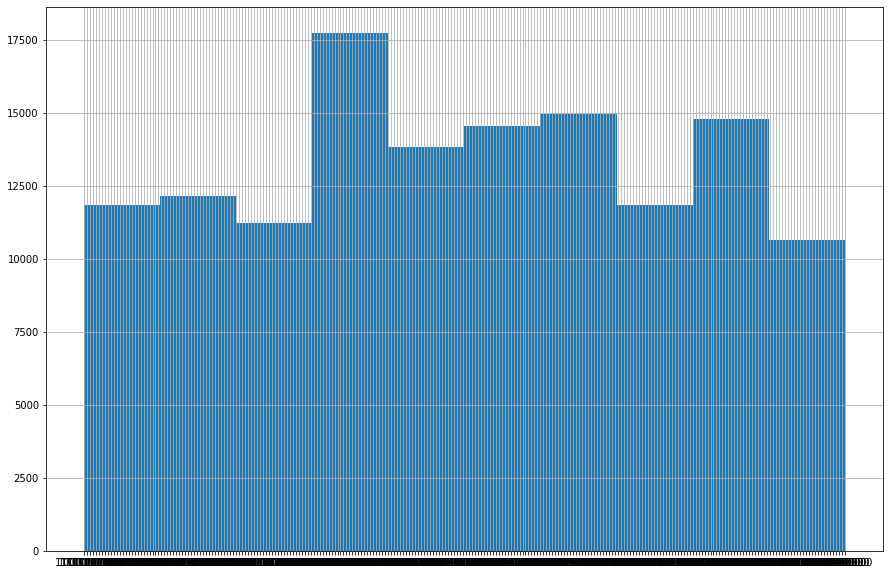

In [47]:
df['coord'].astype(str).hist(figsize=(15,10))

In [48]:
df['coord'] = df['coord'].astype(str)
fig = px.scatter_mapbox(df.dropna(), lat="LATITUDE", lon="LONGITUDE", color='coord',zoom=12)
fig.update_layout(mapbox_style="dark")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [49]:
len(df['coord'].unique())

256

In [46]:
datas = list(all_data.DATAHORA.dt.date.unique())
datas

[datetime.date(2020, 4, 5),
 datetime.date(2020, 4, 6),
 datetime.date(2020, 4, 7),
 datetime.date(2020, 4, 9),
 datetime.date(2020, 4, 10)]

In [49]:
data = datas[-1]
data

datetime.date(2020, 4, 10)

'2020-04-10'